**Projet 6**  Analysez les ventes d'une librairie 

Objectifs pédegogiques : 
- Maitriser les bases de probabilités
- Initiation à la statistique inférentielle
- Réaliser une analyse **bivariée**
- Analyser des series temportelles


*Import des libraires*

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime as dt
import plotly.express as px
import warnings
import scipy.stats as st
import statsmodels.api as sm
from scipy.stats.stats import pearsonr
warnings.filterwarnings('ignore')
from statsmodels.formula.api import ols
from statistics import median as stat

import matplotlib.image as img



# Import et visualisation des données

In [20]:

df_transactions = pd.read_csv("transactions.csv")
df_products = pd.read_csv("products.csv")
df_customers = pd.read_csv("customers.csv")


In [21]:
df_transactions.head(5)

,id_prod,date,session_id,client_id
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103
1,1_251,2022-02-02 07:55:19.149409,s_158752,c_8534
2,0_1277,2022-06-18 15:44:33.155329,s_225667,c_6714
3,2_209,2021-06-24 04:19:29.835891,s_52962,c_6941
4,0_1509,2023-01-11 08:22:08.194479,s_325227,c_4232


In [22]:
df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 679532 entries, 0 to 679531
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   id_prod     679532 non-null  object
 1   date        679532 non-null  object
 2   session_id  679532 non-null  object
 3   client_id   679532 non-null  object
dtypes: object(4)
memory usage: 20.7+ MB


In [23]:
df_transactions

,id_prod,date,session_id,client_id
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103
1,1_251,2022-02-02 07:55:19.149409,s_158752,c_8534
2,0_1277,2022-06-18 15:44:33.155329,s_225667,c_6714
3,2_209,2021-06-24 04:19:29.835891,s_52962,c_6941
4,0_1509,2023-01-11 08:22:08.194479,s_325227,c_4232
...,...,...,...,...
679527,0_1551,2022-01-15 13:05:06.246925,s_150195,c_8489
679528,1_639,2022-03-19 16:03:23.429229,s_181434,c_4370
679529,0_1425,2022-12-20 04:33:37.584749,s_314704,c_304
679530,0_1994,2021-07-16 20:36:35.350579,s_63204,c_2227


In [24]:
df_products.head(5)

,id_prod,price,categ
0,0_1421,19.99,0
1,0_1368,5.13,0
2,0_731,17.99,0
3,1_587,4.99,1
4,0_1507,3.99,0


In [25]:
df_products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3287 entries, 0 to 3286
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id_prod  3287 non-null   object 
 1   price    3287 non-null   float64
 2   categ    3287 non-null   int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 77.2+ KB


In [26]:
df_customers.head(5)

,client_id,sex,birth
0,c_4410,f,1967
1,c_7839,f,1975
2,c_1699,f,1984
3,c_5961,f,1962
4,c_5320,m,1943


In [27]:
df_customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8623 entries, 0 to 8622
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   client_id  8623 non-null   object
 1   sex        8623 non-null   object
 2   birth      8623 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 202.2+ KB


# Contrôle et Nettoyage des données

In [28]:

#On transforme aussi le type de la colonne "categ" en category, plus approprié à cette colonne
df_products.categ=df_products.categ.astype("category")

In [29]:
# visualisation des données de la valeur test
print(df_transactions.loc[(df_transactions['id_prod'] == 'T_0')])

       id_prod                             date session_id client_id
3019       T_0  test_2021-03-01 02:30:02.237419        s_0      ct_0
5138       T_0  test_2021-03-01 02:30:02.237425        s_0      ct_0
9668       T_0  test_2021-03-01 02:30:02.237437        s_0      ct_1
10728      T_0  test_2021-03-01 02:30:02.237436        s_0      ct_0
15292      T_0  test_2021-03-01 02:30:02.237430        s_0      ct_0
...        ...                              ...        ...       ...
657830     T_0  test_2021-03-01 02:30:02.237417        s_0      ct_0
662081     T_0  test_2021-03-01 02:30:02.237427        s_0      ct_1
670680     T_0  test_2021-03-01 02:30:02.237449        s_0      ct_1
671647     T_0  test_2021-03-01 02:30:02.237424        s_0      ct_1
679180     T_0  test_2021-03-01 02:30:02.237425        s_0      ct_1

[200 rows x 4 columns]


In [30]:
# Retire le produit test T_0
df_transactions = df_transactions.loc[df_transactions['id_prod'] != 'T_0']
df_transactions

,id_prod,date,session_id,client_id
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103
1,1_251,2022-02-02 07:55:19.149409,s_158752,c_8534
2,0_1277,2022-06-18 15:44:33.155329,s_225667,c_6714
3,2_209,2021-06-24 04:19:29.835891,s_52962,c_6941
4,0_1509,2023-01-11 08:22:08.194479,s_325227,c_4232
...,...,...,...,...
679527,0_1551,2022-01-15 13:05:06.246925,s_150195,c_8489
679528,1_639,2022-03-19 16:03:23.429229,s_181434,c_4370
679529,0_1425,2022-12-20 04:33:37.584749,s_314704,c_304
679530,0_1994,2021-07-16 20:36:35.350579,s_63204,c_2227


## Ajout des valeurs manquantes dans df_transations pour stats

In [31]:
#Transformer la valeur date en datetime
df_transactions['date'] = pd.to_datetime(df_transactions['date'])

#Ajouter une variable avec l'année et le mois
df_transactions['jour'] = df_transactions['date'].dt.date
df_transactions['jour']= pd.to_datetime(df_transactions['jour'])
df_transactions['annee'] = df_transactions['date'].dt.year
df_transactions['mois'] = df_transactions['date'].dt.month
df_transactions['year_month'] =df_transactions['date'].astype('str').str.slice(2, 7, 1)

df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 679332 entries, 0 to 679531
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   id_prod     679332 non-null  object        
 1   date        679332 non-null  datetime64[ns]
 2   session_id  679332 non-null  object        
 3   client_id   679332 non-null  object        
 4   jour        679332 non-null  datetime64[ns]
 5   annee       679332 non-null  int64         
 6   mois        679332 non-null  int64         
 7   year_month  679332 non-null  object        
dtypes: datetime64[ns](2), int64(2), object(4)
memory usage: 46.6+ MB


In [32]:
df_transactions

,id_prod,date,session_id,client_id,jour,annee,mois,year_month
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103,2022-05-20,2022,5,22-05
1,1_251,2022-02-02 07:55:19.149409,s_158752,c_8534,2022-02-02,2022,2,22-02
2,0_1277,2022-06-18 15:44:33.155329,s_225667,c_6714,2022-06-18,2022,6,22-06
3,2_209,2021-06-24 04:19:29.835891,s_52962,c_6941,2021-06-24,2021,6,21-06
4,0_1509,2023-01-11 08:22:08.194479,s_325227,c_4232,2023-01-11,2023,1,23-01
...,...,...,...,...,...,...,...,...
679527,0_1551,2022-01-15 13:05:06.246925,s_150195,c_8489,2022-01-15,2022,1,22-01
679528,1_639,2022-03-19 16:03:23.429229,s_181434,c_4370,2022-03-19,2022,3,22-03
679529,0_1425,2022-12-20 04:33:37.584749,s_314704,c_304,2022-12-20,2022,12,22-12
679530,0_1994,2021-07-16 20:36:35.350579,s_63204,c_2227,2021-07-16,2021,7,21-07


In [33]:
prod_manquant = pd.merge(df_transactions, df_products, how='outer', on='id_prod', indicator=True) .query('_merge!="both"').drop(columns='_merge')
prod_manquant = prod_manquant.loc[(prod_manquant['price'].isna() == True)]
prod_manquant = prod_manquant.groupby('id_prod').sum()
prod_manquant

,annee,mois,price
id_prod,,,
0_2245,446789.0,1418.0,0.0


je vais merger en "inner" afin d'avoir toutes les données. cet article sera donc supprimé 

## controle doublon et na

In [34]:
# controle les NAN avec le isna
df_products.isna().sum()

id_prod    0
price      0
categ      0
dtype: int64

In [35]:
# controle les NAN avec le isna
df_transactions.isna().sum()

id_prod       0
date          0
session_id    0
client_id     0
jour          0
annee         0
mois          0
year_month    0
dtype: int64

In [36]:
# controle les NAN avec le isna
df_customers.isna().sum()

client_id    0
sex          0
birth        0
dtype: int64

In [37]:
# controle des doublons sur la clé primaire
df_products['id_prod'].duplicated().sum()

0

In [38]:
# controle des doublons sur la clé primaire
df_customers['client_id'].duplicated().sum()

0

# Merge des données

In [39]:
df_transa_product = pd.merge(df_transactions, df_products, how='inner', on='id_prod')

In [40]:
df_transa_prod_client = pd.merge(df_transa_product, df_customers, how='inner', on='client_id')

In [41]:
# ajout de la données : age 
df_transa_prod_client['age'] = 2023 - df_transa_prod_client['birth']


df_transa_prod_client.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 679111 entries, 0 to 679110
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   id_prod     679111 non-null  object        
 1   date        679111 non-null  datetime64[ns]
 2   session_id  679111 non-null  object        
 3   client_id   679111 non-null  object        
 4   jour        679111 non-null  datetime64[ns]
 5   annee       679111 non-null  int64         
 6   mois        679111 non-null  int64         
 7   year_month  679111 non-null  object        
 8   price       679111 non-null  float64       
 9   categ       679111 non-null  category      
 10  sex         679111 non-null  object        
 11  birth       679111 non-null  int64         
 12  age         679111 non-null  int64         
dtypes: category(1), datetime64[ns](2), float64(1), int64(4), object(5)
memory usage: 68.0+ MB


la données 'price' correspond à la données chiffre d'affaire par produit

le numero de session coorespond au numero de commande

In [42]:
df_transa_prod_client

,id_prod,date,session_id,client_id,jour,annee,mois,year_month,price,categ,sex,birth,age
0,0_1518,2022-05-20 13:21:29.043970,s_211425,c_103,2022-05-20,2022,5,22-05,4.18,0,f,1986,37
1,0_1518,2021-07-20 13:21:29.043970,s_64849,c_103,2021-07-20,2021,7,21-07,4.18,0,f,1986,37
2,0_1518,2022-08-20 13:21:29.043970,s_255965,c_103,2022-08-20,2022,8,22-08,4.18,0,f,1986,37
3,0_1418,2022-06-18 01:49:37.823274,s_225411,c_103,2022-06-18,2022,6,22-06,8.57,0,f,1986,37
4,0_1418,2021-08-18 01:49:37.823274,s_77214,c_103,2021-08-18,2021,8,21-08,8.57,0,f,1986,37
...,...,...,...,...,...,...,...,...,...,...,...,...,...
679106,2_147,2021-07-23 07:01:38.963669,s_65994,c_4391,2021-07-23,2021,7,21-07,181.99,2,f,2001,22
679107,0_142,2022-03-25 18:07:25.880052,s_184472,c_1232,2022-03-25,2022,3,22-03,19.85,0,f,1960,63
679108,0_142,2021-09-25 18:07:25.880052,s_95415,c_1232,2021-09-25,2021,9,21-09,19.85,0,f,1960,63
679109,2_205,2021-03-11 00:11:32.016264,s_4605,c_7534,2021-03-11,2021,3,21-03,100.99,2,m,1992,31


# Partie 1 : indicateur de vente - mail Antoine

Une analyse des différents indicateurs de vente, qui a été demandée directement par Antoine. Je t’ai mis en pièce jointe l’e-mail qu’il m’a envoyé résumant ses demandes.


 - Dans un premier temps, je vais avoir besoin de différents indicateurs et graphiques autour du chiffre d'affaires. 
 

- Peux-tu également regarder l’évolution dans le temps et mettre en place une décomposition en moyenne mobile pour évaluer la tendance globale ?


-  Il serait également intéressant de faire un zoom sur les références, pour voir un peu les tops et les flops, la répartition par catégorie, etc.


- Enfin, j’aimerais avoir quelques informations sur les profils de nos clients, et également la répartition du chiffre d'affaires entre eux, via par exemple une courbe de Lorenz.


-  Après, toutes les informations et tous graphiques qui apporteraient de l’information pertinente sont les bienvenus !


In [43]:
# Informations temporelles sur mes données

df_transa_prod_client.date = pd.to_datetime(df_transa_prod_client.date)

print("Les données sont collectées à partir du",df_transa_prod_client.date.min(),", jusqu'au", df_transa_prod_client.date.max())
print("soit", df_transa_prod_client.date.max()-df_transa_prod_client.date.min())

Les données sont collectées à partir du 2021-03-01 00:01:07.843138 , jusqu'au 2023-02-28 23:58:30.792755
soit 729 days 23:57:22.949617


## Chiffres d'affaire

Dans un premier temps, je vais avoir besoin de différents indicateurs et graphiques autour du chiffre d'affaires.

### CA Total

In [44]:
ca_total= df_transa_prod_client['price'].sum()
ca_total
print('Le CA total est de : ', round(ca_total,2),'€ soit',round(ca_total/1000,2),"milliers d'€ soit",round(ca_total/1000000,2),"millions d'€")

Le CA total est de :  11853728.68 € soit 11853.73 milliers d'€ soit 11.85 millions d'€


### CA par an

In [45]:
# Création du DF
df_ca_annee = df_transa_prod_client[['annee','price']]
df_ca_annee = df_ca_annee.groupby('annee').sum()
df_ca_annee = df_ca_annee.sort_values(by=['annee'],ascending=True)
df_ca_annee

,price
annee,
2021,4770826.56
2022,6108681.81
2023,974220.31


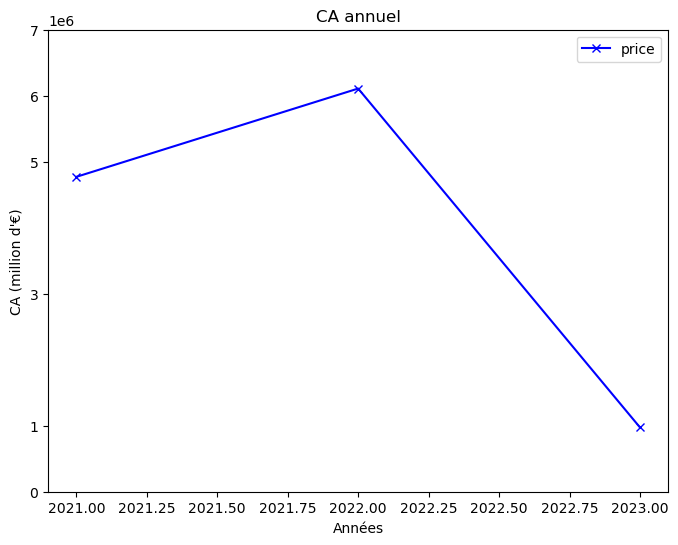

In [46]:

#On regarde l'evolution du chiffre d'affaires mensuel sur les 3 années
df_ca_annee.plot(figsize=(8,6),marker="x",color="blue",yticks=(0,1000000,3000000,5000000,6000000,7000000))
plt.title("CA annuel")
plt.xlabel("Années")
plt.ylabel("CA (million d'€)")
plt.show()
#plt.savefig("CAannuel.jpg")

### CA par  mois

In [47]:
df_ca_mois = df_transa_prod_client[['year_month','price']]
df_ca_mois = df_ca_mois.groupby('year_month').sum()
df_ca_mois = df_ca_mois.sort_values(by=['year_month'],ascending=True).reset_index()


In [48]:
# graphique
fig = px.bar(df_ca_mois, x="year_month", y="price", barmode = 'stack')
fig.show()

In [49]:
# création du graphique 
fig = px.line(df_ca_mois, x="year_month", y=df_ca_mois.columns,
              hover_data={"year_month": "|%B %d, %Y"},
              title='CA par mois')
fig.show()

### CA par jour

In [50]:
df_ca_jour = df_transa_prod_client[['jour','price']]
df_ca_jour = df_ca_jour.groupby('jour').sum()
df_ca_jour = df_ca_jour.sort_values(by=['jour'],ascending=True).reset_index()



In [51]:
#On regarde l'evolution du chiffre d'affaires journalier sur les 3 années
# création du graphique 
fig = px.line(df_ca_jour, x=df_ca_jour.jour, y=df_ca_jour.price,
              hover_data={"jour": "|%B %d, %Y"},
              title='CA par jour')
fig.show()

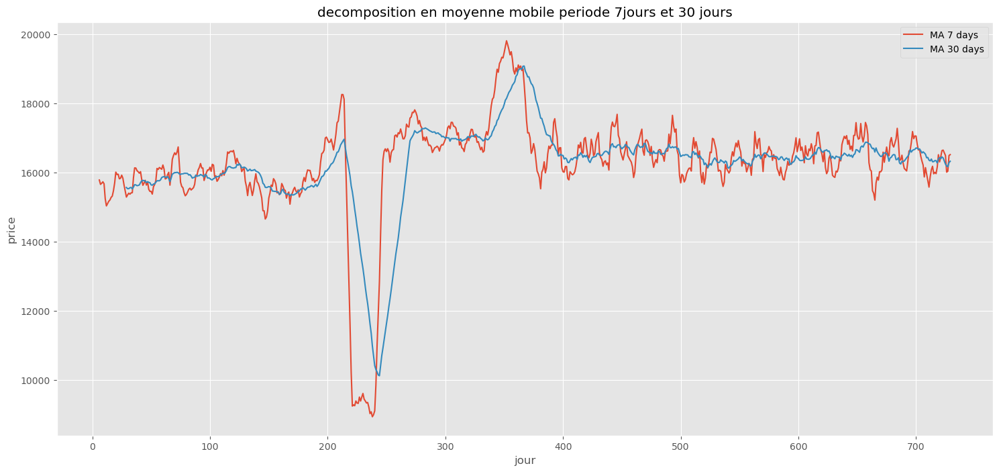

In [52]:
## Moyenne mobile
#moyenne lisée sur x jours .rolling

#On affiche une decomposition en moyenne mobile pourune periode de 7 et 30 jours

plt.style.use('ggplot')
plt.figure(figsize=(18,8))
plt.plot(df_ca_jour.rolling(7).mean(),label= 'MA 7 days')
plt.plot(df_ca_jour.rolling(30).mean(),label= 'MA 30 days')
plt.legend(loc='best')
plt.title('decomposition en moyenne mobile periode 7jours et 30 jours')
plt.xlabel("jour")
plt.ylabel("price")
plt.show()

### focus octobre 2021

In [53]:
# focus  oct 2021
df_ca_jour_oct = df_transa_prod_client.loc[(df_transa_prod_client['year_month'] == '21-10')]
df_ca_jour_oct

df_ca_jour_oct = df_ca_jour_oct[['jour','price']]
df_ca_jour_oct = df_ca_jour_oct.groupby('jour').sum()
df_ca_jour_oct = df_ca_jour_oct.sort_values(by=['jour'],ascending=True).reset_index()


In [54]:
#On regarde l'evolution du chiffre d'affaires journalier sur les 3 années
# création du graphique 
fig = px.line(df_ca_jour_oct, x=df_ca_jour_oct.jour, y=df_ca_jour_oct.price,
              hover_data={"jour": "|%B %d, %Y"},
              title='CA par jour - focus Oct 2021')
fig.show()

### CA par catégorie

In [55]:
# création du dataframe
df_ca_categ= df_transa_prod_client[['categ','price']]
df_ca_categ = df_ca_categ.groupby('categ').sum()
df_ca_categ['pourcentage'] = round(df_ca_categ.groupby('categ').sum()/ca_total*100,2)
df_ca_categ = df_ca_categ.sort_values(by=['categ'],ascending=True).reset_index()
df_ca_categ

,categ,price,pourcentage
0,0,4419730.97,37.29
1,1,4653722.69,39.26
2,2,2780275.02,23.45


In [56]:
#On affiche le CA en fonction des catégories
fig = px.pie(df_ca_categ, values='price', names='categ', width=500,height=500, title='Répartition du CA par catégorie')
fig.show()

### CA par catégorie et par mois

In [57]:
# création du dataframe
df_CA_cat = df_transa_prod_client.groupby(["year_month", "categ"]).agg({"price" : "sum"})
df_CA_cat = df_CA_cat.reset_index()

# graphique
fig = px.bar(df_CA_cat, x="year_month", y="price", color="categ", barmode = 'stack')
fig.show()

In [58]:
# création du dataframe
df_CA_cat_tcd = df_transa_prod_client.groupby(["year_month", "categ"]).agg({"price" : "sum"})
# création du TCD
df_CA_cat_tcd = pd.pivot_table(df_CA_cat_tcd, values ='price', index =['year_month'],  columns =['categ'], aggfunc = np.sum)
df_CA_cat_tcd = df_CA_cat_tcd.reset_index()

# création du graphique 
fig = px.line(df_CA_cat_tcd, x="year_month", y=df_CA_cat_tcd.columns,
              hover_data={"year_month": "|%B %d, %Y"},
              title='CA par catégorie et par mois')
fig.show()

### focus oct 2021 categ 1

In [59]:
# focus  cat 1
df_focus_categ1 = df_transa_prod_client.loc[(df_transa_prod_client['categ'] == 1)&(df_transa_prod_client['year_month'] == '21-10')]
df_focus_categ1

,id_prod,date,session_id,client_id,jour,annee,mois,year_month,price,categ,sex,birth,age
96,1_249,2021-10-28 07:12:57.082901,s_111235,c_103,2021-10-28,2021,10,21-10,22.99,1,f,1986,37
400,1_366,2021-10-31 03:29:26.732008,s_112546,c_682,2021-10-31,2021,10,21-10,28.54,1,f,1974,49
482,1_343,2021-10-28 03:08:20.379435,s_111160,c_682,2021-10-28,2021,10,21-10,27.99,1,f,1974,49
846,1_395,2021-10-30 11:44:29.472147,s_112260,c_7217,2021-10-30,2021,10,21-10,28.99,1,f,1976,47
1566,1_466,2021-10-28 12:40:12.728488,s_111330,c_4377,2021-10-28,2021,10,21-10,15.81,1,m,1975,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...
675900,1_388,2021-10-31 02:08:17.584759,s_112518,c_6779,2021-10-31,2021,10,21-10,16.70,1,m,1995,28
677027,1_274,2021-10-01 02:49:47.820561,s_98236,c_2866,2021-10-01,2021,10,21-10,24.40,1,f,1992,31
677179,1_639,2021-10-28 17:44:14.325576,s_111419,c_223,2021-10-28,2021,10,21-10,10.99,1,f,1968,55
678161,1_296,2021-10-31 09:25:15.386659,s_112669,c_1828,2021-10-31,2021,10,21-10,24.67,1,m,2004,19


In [60]:
# focus  cat 1
df_focus_categ1 = df_transa_prod_client.loc[(df_transa_prod_client['year_month'] == '21-10')]

df_ca_jour_cat1 = df_focus_categ1[['jour','price','categ']]
df_ca_jour_cat1 = df_ca_jour_cat1.groupby(["jour", "categ"]).sum()
df_ca_jour_cat1 = df_ca_jour_cat1.sort_values(by=['jour'],ascending=True).reset_index()

# graphique
fig = px.bar(df_ca_jour_cat1, x="jour", y="price", color="categ", barmode = 'stack')
fig.show()

### CA par genre

In [61]:

df_ca_genre = df_transa_prod_client[['sex', 'price']]
df_ca_genre = df_ca_genre.groupby('sex').sum().reset_index()
#df_ca_genre = df_ca_genre.sort_values(by=['price'],ascending=False).reset_index()

fig = px.pie(df_ca_genre, values='price', names='sex', width=500,
             height=500, title="Répartition du CA : Femme / Homme")
fig.show()

### CA par age

In [62]:
df_ca_age= df_transa_prod_client[['age','price']]
df_ca_age = df_ca_age.groupby('age').sum().reset_index()
df_ca_age

,age,price
0,19,609013.69
1,20,178195.78
2,21,184177.35
3,22,178497.70
4,23,165007.98
...,...,...
71,90,5254.35
72,91,5043.19
73,92,2815.45
74,93,4013.87


In [63]:
# graphique
fig = px.bar(df_ca_age, x="age", y="price", barmode = 'stack')
fig.show()

### CA par session / par commande

In [64]:
df_ca_session= df_transa_prod_client[['session_id','price']]
df_ca_session = df_ca_session.groupby('session_id').sum()
df_ca_session = df_ca_session.sort_values(by=['price'],ascending=False).reset_index()
df_ca_session

,session_id,price
0,s_95844,568.88
1,s_123227,539.23
2,s_83158,535.17
3,s_335005,535.17
4,s_150439,496.22
...,...,...
342270,s_34456,0.62
342271,s_41352,0.62
342272,s_104606,0.62
342273,s_107417,0.62


In [65]:
df_ca_session.describe()

,price
count,342275.000000
mean,34.632178
std,32.597836
min,0.620000
25%,15.560000
50%,25.790000
75%,43.160000
max,568.880000


In [66]:
fig = px.box(df_ca_session, x="price")
fig.show()

## Focus PRODUCT

In [67]:
nb_prod_total= df_products['id_prod'].count()
nb_prod_total

3287

### CA par product - TOP 10

In [68]:
df_ca_product= df_transa_prod_client[['id_prod','price']]
df_ca_product = df_ca_product.groupby('id_prod').sum()
df_ca_product = df_ca_product.sort_values(by=['price'],ascending=False).reset_index()
df_ca_product.head(10)

,id_prod,price
0,2_159,94893.50
1,2_135,69334.95
2,2_112,65407.76
3,2_102,60736.78
4,2_209,56971.86
5,1_395,54356.25
6,1_369,54025.48
7,2_110,53846.25
8,2_39,53060.85
9,2_166,52449.12


### CA par product - FLOP 10

In [69]:
df_ca_product= df_transa_prod_client[['id_prod','price']]
df_ca_product = df_ca_product.groupby('id_prod').sum()
df_ca_product = df_ca_product.sort_values(by=['price'],ascending=True).reset_index()
df_ca_product.head(10)

,id_prod,price
0,0_1539,0.99
1,0_1284,1.38
2,0_1653,1.98
3,0_1601,1.99
4,0_807,1.99
5,0_541,1.99
6,0_1728,2.27
7,0_1498,2.48
8,0_898,2.54
9,0_1840,2.56


mettre le CA avec mois/ categrorie en histo empilé

### repartition des prix par catégorie

In [70]:
fig = px.box(df_products, x="price", y='categ',title='Répartition des prix en fonction de la catégorie')
fig.show()

les prix de la categorie 2 est le plus élevé.

### nombre d'achat par catégorie - fréquence d'achat

Fréquence d’achat = Nombre total de commandes / Nombre total de commandes par catégorie

In [71]:
# création du dataframe
df_ca_categ= df_transa_prod_client[['categ','client_id']]
df_ca_categ = df_ca_categ.groupby('categ').count().reset_index()


#On affiche le CA en fonction des catégories
fig = px.pie(df_ca_categ, values='client_id', names='categ', width=600, height=600,
             title=" Fréquence d'achat par catégorie")
fig.show()

### lorenz controle paréto par produit

In [72]:
#CA par produit - courbe de lorenz
df_ca_produit = df_transa_prod_client[['id_prod','price']]
df_ca_produit = df_ca_produit.groupby('id_prod').sum().reset_index()
df_ca_produit = df_ca_produit.sort_values(by=['price'],ascending=False).reset_index()

df_ca_produit['nbprod'] = 1
df_ca_produit['pourc_prod'] = 100*(df_ca_produit.nbprod/nb_prod_total)
df_ca_produit['pourc_prod_cumul'] = 100*(df_ca_produit.nbprod.cumsum() / df_ca_produit.nbprod.sum())


df_ca_produit['pourc_price'] = round(df_ca_produit.price/ca_total*100,2)
df_ca_produit['pourc_price_cumul'] = 100*(df_ca_produit.price.cumsum() / df_ca_produit.price.sum())

# ajouter la représention en % en cumul pour le paréto?
df_ca_produit


,index,id_prod,price,nbprod,pourc_prod,pourc_prod_cumul,pourc_price,pourc_price_cumul
0,3096,2_159,94893.50,1,0.030423,0.030628,0.80,0.800537
1,3070,2_135,69334.95,1,0.030423,0.061256,0.58,1.385458
2,3045,2_112,65407.76,1,0.030423,0.091884,0.55,1.937249
3,3034,2_102,60736.78,1,0.030423,0.122511,0.51,2.449634
4,3152,2_209,56971.86,1,0.030423,0.153139,0.48,2.930258
...,...,...,...,...,...,...,...,...
3260,665,0_1601,1.99,1,0.030423,99.877489,0.00,99.999947
3261,2079,0_807,1.99,1,0.030423,99.908116,0.00,99.999963
3262,719,0_1653,1.98,1,0.030423,99.938744,0.00,99.999980
3263,313,0_1284,1.38,1,0.030423,99.969372,0.00,99.999992


In [73]:
fig = px.line(df_ca_produit, x="pourc_price_cumul", y="pourc_prod_cumul", width=800, height=800)
fig.show()


ok respect de la regle des 80/20 du paréto
20% de produit représentent 80% des ventes

## Focus CLIENT

### CA par client - courbe de lorenz

In [74]:
#CA par client - courbe de lorenz
df_ca_client = df_transa_prod_client[['client_id','price']]
df_ca_client = df_ca_client.groupby('client_id').sum()
df_ca_client = df_ca_client.sort_values(by=['price'],ascending=False).reset_index()

totalclient = len(df_ca_client['client_id'])

df_ca_client['nbclient'] = 1
df_ca_client['pourc_client'] = 100*(df_ca_client.nbclient/totalclient)
df_ca_client['pourc_client_cumul'] = 100*(df_ca_client.nbclient.cumsum() / df_ca_client.nbclient.sum())


df_ca_client['pourc_price'] = round(df_ca_client.price/ca_total*100,2)
df_ca_client['pourc_price_cumul'] = 100*(df_ca_client.price.cumsum() / df_ca_client.price.sum())

# ajouter la représention en % en cumul pour le paréto?
df_ca_client.head(10)


,client_id,price,nbclient,pourc_client,pourc_client_cumul,pourc_price,pourc_price_cumul
0,c_1609,324033.35,1,0.011628,0.011628,2.73,2.733599
1,c_4958,289760.34,1,0.011628,0.023256,2.44,5.178064
2,c_6714,153598.92,1,0.011628,0.034884,1.30,6.473850
3,c_3454,113637.93,1,0.011628,0.046512,0.96,7.432518
4,c_3263,5276.87,1,0.011628,0.058140,0.04,7.477035
5,c_1570,5271.62,1,0.011628,0.069767,0.04,7.521507
6,c_2899,5214.05,1,0.011628,0.081395,0.04,7.565494
7,c_2140,5208.82,1,0.011628,0.093023,0.04,7.609436
8,c_7319,5155.77,1,0.011628,0.104651,0.04,7.652931
9,c_7959,5085.45,1,0.011628,0.116279,0.04,7.695833


In [75]:
fig = px.line(df_ca_client, x="pourc_price_cumul", y="pourc_client_cumul", width=800, height=800)
fig.show()


KO => loi de Pareto n'est pas respectée : 48.7% des clients font 20% du CA, et 50% des clients font 80% du CA. 

J'observe aussi que le debut de la courbe est horizontale : cela correspond aux 4 meilleurs clients, qui représentent un gros montant du CA (outliers).
4.6% des clients représentent 7.5%du CA

### classement de client par scoring RFM

Récence : la date du dernier achat. Notez bien que l’on part du principe qu’une personne qui a acheté récemment chez vous a plus de chances de revenir commander chez vous.

Fréquence : le nombre d’achats réalisé sur une période donnée. Plus un client achète régulièrement chez vous, plus il y a de chances pour qu’il achète à nouveau. Vous l’avez compris, on analyse ici son niveau de fidélité.

Montant : la somme des achats cumulés sur une période donnée. Les gros acheteurs répondent mieux que les petits. On mesure ici la valeur client.

In [76]:
# On Groupby selon le numéro de transaction
df_commandes = df_transa_prod_client.groupby(['session_id', 'client_id', "age"]).agg(
    {'date': 'max', "session_id": "count", 'price': 'sum'})
df_commandes.rename(columns={'session_id': "nb_lignes"}, inplace=True)
df_commandes = df_commandes.reset_index()
df_commandes

,session_id,client_id,age,date,nb_lignes,price
0,s_1,c_329,56,2021-03-01 00:01:07.843138,1,11.99
1,s_10,c_2218,53,2021-03-01 00:10:33.163037,1,26.99
2,s_100,c_3854,45,2021-03-01 04:43:58.025677,2,33.72
3,s_1000,c_1014,34,2021-03-03 03:25:12.320225,4,39.22
4,s_10000,c_476,34,2021-03-22 18:15:03.831240,3,41.49
...,...,...,...,...,...,...
342270,s_99994,c_7685,40,2021-10-04 18:56:23.112236,3,28.92
342271,s_99995,c_4170,63,2021-10-04 18:35:32.201073,1,19.84
342272,s_99996,c_4900,49,2021-10-04 18:58:49.228317,4,56.27
342273,s_99997,c_3521,44,2021-10-04 18:45:38.003516,1,6.99


In [77]:
df_recency = df_commandes.groupby(by='client_id',as_index=False)['date'].max()
df_recency.columns = ['CustomerName', 'LastPurchaseDate']
recent_date = df_recency['LastPurchaseDate'].max()
df_recency['Recency'] = df_recency['LastPurchaseDate'].apply(
    lambda x: (recent_date - x).days)
df_recency

,CustomerName,LastPurchaseDate,Recency
0,c_1,2023-01-15 20:46:25.222740,44
1,c_10,2023-01-27 03:39:36.431524,32
2,c_100,2022-09-20 05:26:43.133053,161
3,c_1000,2023-01-24 13:34:23.415697,35
4,c_1001,2023-02-23 23:19:47.625822,5
...,...,...,...
8595,c_995,2022-11-21 14:20:58.744903,99
8596,c_996,2023-02-21 05:36:20.226099,7
8597,c_997,2023-02-05 02:02:14.787358,23
8598,c_998,2023-02-22 23:59:52.476912,5


In [78]:
frequency_df = df_commandes.drop_duplicates().groupby(by=['client_id'], as_index=False)['date'].count()
frequency_df.columns = ['CustomerName', 'Frequency']
frequency_df

,CustomerName,Frequency
0,c_1,33
1,c_10,34
2,c_100,5
3,c_1000,93
4,c_1001,47
...,...,...
8595,c_995,9
8596,c_996,79
8597,c_997,24
8598,c_998,23


In [79]:
monetary_df = df_commandes.groupby(by='client_id', as_index=False)['price'].sum()
monetary_df.columns = ['CustomerName', 'Monetary']
monetary_df

,CustomerName,Monetary
0,c_1,558.18
1,c_10,1353.60
2,c_100,254.85
3,c_1000,2261.89
4,c_1001,1812.86
...,...,...
8595,c_995,189.41
8596,c_996,1625.58
8597,c_997,1490.01
8598,c_998,2779.88


In [80]:
rf_df = df_recency.merge(frequency_df, on='CustomerName')
rfm_df = rf_df.merge(monetary_df, on='CustomerName').drop(columns='LastPurchaseDate')
rfm_df

,CustomerName,Recency,Frequency,Monetary
0,c_1,44,33,558.18
1,c_10,32,34,1353.60
2,c_100,161,5,254.85
3,c_1000,35,93,2261.89
4,c_1001,5,47,1812.86
...,...,...,...,...
8595,c_995,99,9,189.41
8596,c_996,7,79,1625.58
8597,c_997,23,24,1490.01
8598,c_998,5,23,2779.88


In [81]:
rfm_df['R_rank'] = rfm_df['Recency'].rank(ascending=False)
rfm_df['F_rank'] = rfm_df['Frequency'].rank(ascending=True)
rfm_df['M_rank'] = rfm_df['Monetary'].rank(ascending=True)
 
# normalizing the rank of the customers
rfm_df['R_rank_norm'] = (rfm_df['R_rank']/rfm_df['R_rank'].max())*100
rfm_df['F_rank_norm'] = (rfm_df['F_rank']/rfm_df['F_rank'].max())*100
rfm_df['M_rank_norm'] = (rfm_df['F_rank']/rfm_df['M_rank'].max())*100
 
rfm_df.drop(columns=['R_rank', 'F_rank', 'M_rank'], inplace=True)
 
rfm_df.head()

,CustomerName,Recency,Frequency,Monetary,R_rank_norm,F_rank_norm,M_rank_norm
0,c_1,44,33,558.18,24.488335,59.063953,59.063953
1,c_10,32,34,1353.60,32.310997,60.215116,60.215116
2,c_100,161,5,254.85,4.642282,3.610465,3.610465
3,c_1000,35,93,2261.89,29.828749,92.313953,92.313953
4,c_1001,5,47,1812.86,78.900889,72.726744,72.726744


In [82]:
rfm_df['RFM_Score'] = 0.15*rfm_df['R_rank_norm']+0.28 * \
    rfm_df['F_rank_norm']+0.57*rfm_df['M_rank_norm']
rfm_df['RFM_Score'] *= 0.05
rfm_df = rfm_df.round(2)
rfm_df[['CustomerName', 'RFM_Score']]

,CustomerName,RFM_Score
0,c_1,2.69
1,c_10,2.80
2,c_100,0.19
3,c_1000,4.15
4,c_1001,3.68
...,...,...
8595,c_995,0.57
8596,c_996,4.28
8597,c_997,2.25
8598,c_998,2.45


Rating Customer based upon the RFM score
rfm score >4.5 : Top Customer
4.5 > rfm score > 4 : High Value Customer
4>rfm score >3 : Medium value customer
3>rfm score>1.6 : Low-value customer
rfm score<1.6 :Lost Customer

In [83]:
rfm_df["Customer_segment"] = np.where(rfm_df['RFM_Score'] >4.5, 
                                      "1 - Top Customers",(np.where(rfm_df['RFM_Score'] > 4, 
                                      "2 - High value Customer", (np.where(rfm_df['RFM_Score'] > 3,
                             "3 - Medium Value Customer", np.where(rfm_df['RFM_Score'] > 1.6,
                            '4 - Low Value Customers', '5 - Lost Customers'))))))

rfm_df = rfm_df[['CustomerName', 'RFM_Score', 'Customer_segment']]

In [84]:
rfm_df_1 = rfm_df.groupby('Customer_segment').count().reset_index()
rfm_df_1

,Customer_segment,CustomerName,RFM_Score
0,1 - Top Customers,644,644
1,2 - High value Customer,930,930
2,3 - Medium Value Customer,1816,1816
3,4 - Low Value Customers,2583,2583
4,5 - Lost Customers,2627,2627


In [85]:
fig = px.pie(rfm_df, values=rfm_df.Customer_segment.value_counts(), names=rfm_df.Customer_segment.value_counts().index, width=700,
             height=700, title="Classifaiction RFM des clients")
fig.show()

# Partie 2 - demande de Julie - comportements clients

Une analyse plus ciblée sur les clients : l’objectif serait cette fois-ci de comprendre le comportement de nos clients en ligne, pour pouvoir ensuite comparer avec la connaissance acquise via nos librairies physiques. Pour cela, je t’invite à voir avec Julie, qui te précisera directement ses demandes à ce niveau.

- lien entre le genre d’un client et les catégories des livres achetés lien entre categorie et categorie => Chi squared

- lien entre l’âge des clients et le montant total des achats lien entre numeric et numeric => test de correlation 

- lien entre age et fréquence d'achats lien entre categorie et numeric => ANOVA ou T-test

- lien entre la taille du panier moyen et les catégories des livres achetés. lien entre categorie et numeric => ANOVA ou T-test

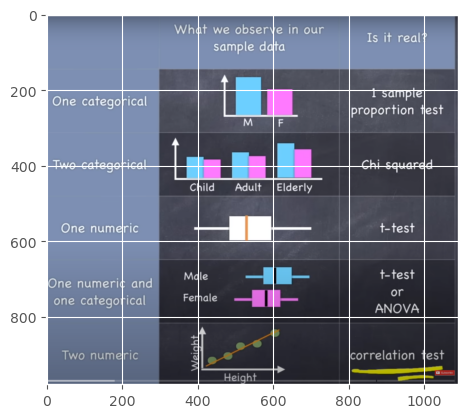

In [86]:
#Pour faciliter l'explication
image = img.imread('Explication.png')
plt.imshow(image)
plt.show()

## préparation des données 

In [87]:
# on retirer les 4 meilleurs clients afin de ne pas fausser les chiffres

#On Crée une variable avec les quatre meilleurs clients
meilleurs_client = df_ca_client.head(4).client_id.to_list() 
meilleurs_client


['c_1609', 'c_4958', 'c_6714', 'c_3454']

In [88]:
df_correlation=df_transa_prod_client.mask(df_transa_prod_client.client_id.isin(meilleurs_client))
df_correlation = df_correlation.sort_values(by=['price'],ascending=False)
df_correlation = df_correlation.loc[df_correlation['id_prod'].notna() == True]
df_correlation

,id_prod,date,session_id,client_id,jour,annee,mois,year_month,price,categ,sex,birth,age
237362,2_2,2021-03-07 14:07:31.004391,s_3041,c_1001,2021-03-07,2021.0,3.0,21-03,300.00,2,m,1982.0,41.0
170704,2_2,2021-06-12 08:44:00.882917,s_47558,c_5237,2021-06-12,2021.0,6.0,21-06,300.00,2,m,1999.0,24.0
170705,2_2,2022-08-12 08:44:00.882917,s_252144,c_5237,2022-08-12,2022.0,8.0,22-08,300.00,2,m,1999.0,24.0
651259,2_2,2022-12-06 23:14:33.815188,s_308128,c_2467,2022-12-06,2022.0,12.0,22-12,300.00,2,f,1997.0,26.0
455085,2_2,2022-03-28 21:24:28.442508,s_185980,c_659,2022-03-28,2022.0,3.0,22-03,300.00,2,f,2001.0,22.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
622857,0_202,2021-05-14 15:26:20.597059,s_34456,c_5510,2021-05-14,2021.0,5.0,21-05,0.62,0,f,1941.0,82.0
326421,0_202,2022-09-08 17:47:18.158963,s_265186,c_3297,2022-09-08,2022.0,9.0,22-09,0.62,0,f,1975.0,48.0
326422,0_202,2022-10-08 17:47:18.158963,s_279628,c_3297,2022-10-08,2022.0,10.0,22-10,0.62,0,f,1975.0,48.0
522848,0_202,2021-08-02 23:27:31.721723,s_70595,c_1367,2021-08-02,2021.0,8.0,21-08,0.62,0,f,1984.0,39.0


In [89]:
#controle du retrait de c_6714 gros client
df_correlation_c = df_correlation.loc[df_correlation['client_id'] == 'c_6714']
df_correlation_c

,id_prod,date,session_id,client_id,jour,annee,mois,year_month,price,categ,sex,birth,age


In [90]:
# préparation d'un Df pour les commandes 
#On Groupby selon le numéro de transaction
df_commandes = df_correlation.groupby(['session_id', 'client_id', "age"]).agg({'date':'max', "session_id":"count", 'price':'sum'})
df_commandes.rename(columns={'session_id':"nb_prod_par_cde"}, inplace=True)
df_commandes = df_commandes.reset_index()
df_commandes

,session_id,client_id,age,date,nb_prod_par_cde,price
0,s_1,c_329,56.0,2021-03-01 00:01:07.843138,1,11.99
1,s_10,c_2218,53.0,2021-03-01 00:10:33.163037,1,26.99
2,s_100,c_3854,45.0,2021-03-01 04:43:58.025677,2,33.72
3,s_1000,c_1014,34.0,2021-03-03 03:25:12.320225,4,39.22
4,s_10000,c_476,34.0,2021-03-22 18:15:03.831240,3,41.49
...,...,...,...,...,...,...
319232,s_99994,c_7685,40.0,2021-10-04 18:56:23.112236,3,28.92
319233,s_99995,c_4170,63.0,2021-10-04 18:35:32.201073,1,19.84
319234,s_99996,c_4900,49.0,2021-10-04 18:58:49.228317,4,56.27
319235,s_99997,c_3521,44.0,2021-10-04 18:45:38.003516,1,6.99


##  le lien entre le genre d’un client et les catégories des livres achetés 

correlation entre 2 variables qualitaives/categorical
=> faire le Chi test


### tableau de contingence

In [91]:
# TCD avec le nombre de valeur
tcd_sex_categ = pd.crosstab(df_correlation['categ'], df_correlation['sex'], values=df_correlation['price'], aggfunc=len)
tcd_sex_categ

sex,f,m
categ,,
0,200793,186488
1,111331,101017
2,16980,15868


### graphique heatmap

In [92]:
fig = px.imshow(tcd_sex_categ,title="Corrélation entre la catégorie et le genre", text_auto=True)

fig.update_layout(
    width=400, height=400,
    xaxis_title="Genre", yaxis_title="Catégorie"
)

fig.show()

### Chi squared test 

H0 : Variables indépendantes si p-value > 5%


H1 : Variables non indépendantes si p-value < 5%

In [93]:
# Test de Chi 2

Khi2_obs, p_value, ddl, effectif_theorique = st.chi2_contingency(tcd_sex_categ)

print('Stat =',Khi2_obs,'\np-value =',p_value)

if p_value > .05:
    print('H0: les valeurs sont independantes')
else:
    print('H1: Il y a une dépendance entre les deux valeurs.')
    

Stat = 20.2134606935139 
p-value = 4.0804003892173473e-05
H1: Il y a une dépendance entre les deux valeurs.


## le lien entre l’âge des clients et le montant total des achats

correlation entre 2 variables quantitatives/numeric
=> faire le calcul du coefficient de corrélation
nommé Pearsonr function 

### Graphique Scatter

In [94]:
#Corrélation âge des clients et montant total des achats

# Groupby sur l'id_client pour avoir le montant total de leurs achats
df_montant_clients = df_correlation.groupby(["client_id", "age"]).agg({"price": "sum"})

df_montant_clients = df_montant_clients.reset_index()

In [95]:
# Diagramme de dispersion
#ols =  mco = regression linéraire

fig = px.scatter(df_montant_clients, x="age", y="price",
                 title="Diagramme de dispersion age, montant total des achats",trendline="ols" )

fig.update_layout(
    width=1000, height=600,
    xaxis_title="Age", yaxis_title="Montant des achats"
)

fig.show()

### Calcul du coefficient de Pearson


Coefficient de Pearson
Le coefficient de corrélation est parfois appelé « coefficient de corrélation produit-moment de Pearson », il a été mis au point par le mathématicien britannique Karl Pearson.
Tout coefficient de corrélation supérieur à 0,8 ou inférieur à -0,8 indique une forte corrélation des deux séries. À l’inverse, tout coefficient inférieur à 0,5 ou supérieur à -0,5 démontre la faible corrélation des séries comparées.

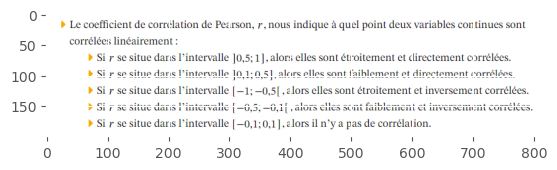

In [96]:
# pour faciliter la comprehension du resultat 
image = img.imread('pearson.png')
plt.imshow(image)
plt.show()

In [97]:
pearsons_coefficient = df_montant_clients.corr()
pearsons_coefficient

,age,price
age,1.000000,-0.188376
price,-0.188376,1.000000


In [98]:
# Calcul du coefficient de Pearson
x = df_montant_clients["age"]
y = df_montant_clients["price"]

r, p_value = st.pearsonr(x, y)
print("Le coefficient de corrélation r est de : {}".format(r))
print("Sa p-value est de : {}".format(p_value))

Le coefficient de corrélation r est de : -0.18837617927219408
Sa p-value est de : 1.7101053363397493e-69


In [99]:
#Conclusion

if r > .5:
    print('alors elles sont étroitement et directement corrélées.')
elif r > .1:
    print('alors elles sont faiblement et directement corrélées.')
elif r > -.1:
    print('alors il n’y a pas de corrélation.')
elif r > -.5:
    print('alors elles sont faiblement et inversement corrélées.')
elif r > -1:
    print('alors elles sont étroitement et inversement corrélées.')
    

alors elles sont faiblement et inversement corrélées.


##  le lien entre age et fréquence d'achats

Fréquence d’achat = Nombre total de commandes / Nombre de clients uniques

In [100]:
# calcul de la frequence globale

nbclient = len(df_ca_client['client_id'])
nbcommande = len(df_commandes['session_id'])
taux_frequence = round(nbcommande/nbclient,2)
print(nbclient,'clients a commandé et',nbcommande,'ont été réalisée soit le taux de fréquence est de',taux_frequence)

8600 clients a commandé et 319237 ont été réalisée soit le taux de fréquence est de 37.12


### Graphique BOX PLOT

In [101]:
# Groupby sur l'id_client pour avoir le montant total de leurs achats

df_freq_age = df_commandes.groupby(["client_id","age"]).agg({"session_id": "count"})
#df_freq_age = pd.DataFrame(df_freq_age)
df_freq_age = df_freq_age.rename(columns={"session_id":"nb_achats"})

nb_mois_periode = 24
df_freq_age.nb_achats = df_freq_age.nb_achats/nb_mois_periode
df_freq_age.reset_index(inplace=True)

# ajout de la categorie age / découpage en quantile
df_freq_age['categ_age'] = pd.cut(df_freq_age['age'], bins=3, include_lowest=True)

df_freq_age

,client_id,age,nb_achats,categ_age
0,c_1,68.0,1.375000,"(44.0, 69.0]"
1,c_10,67.0,1.416667,"(44.0, 69.0]"
2,c_100,31.0,0.208333,"(18.924, 44.0]"
3,c_1000,57.0,3.875000,"(44.0, 69.0]"
4,c_1001,41.0,1.958333,"(18.924, 44.0]"
...,...,...,...,...
8591,c_995,68.0,0.375000,"(44.0, 69.0]"
8592,c_996,53.0,3.291667,"(44.0, 69.0]"
8593,c_997,29.0,1.000000,"(18.924, 44.0]"
8594,c_998,22.0,0.958333,"(18.924, 44.0]"


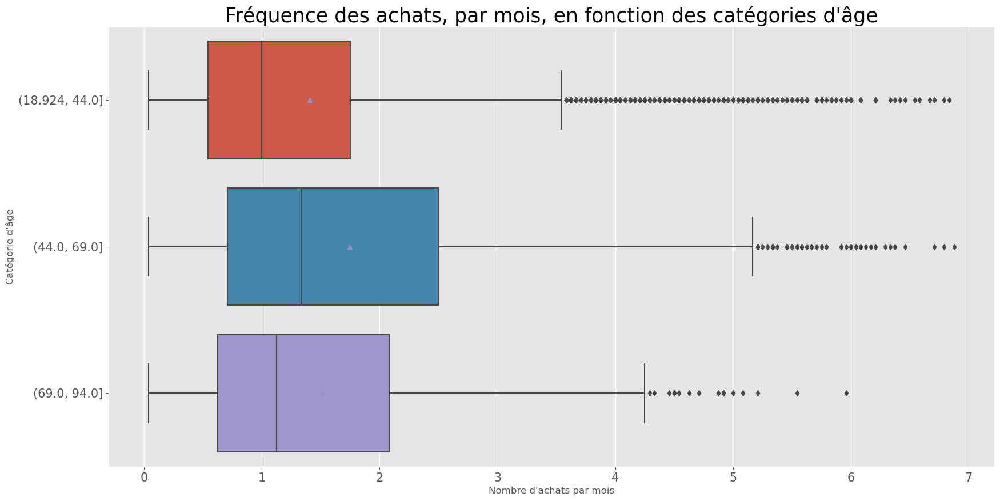

In [102]:
# Modélisation des boxplots

X = "nb_achats" 
Y = "categ_age"

plt.figure(figsize=(20, 10))
sns.boxplot(x=df_freq_age[X], y=df_freq_age[Y], showmeans=True)
plt.title("Fréquence des achats, par mois, en fonction des catégories d'âge", fontsize = '25')
plt.xlabel("Nombre d'achats par mois")
plt.ylabel("Catégorie d'âge")
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()


### ANOVA

Dans notre cas nous devons controler le lien entre age et fréquence d'achats lien entre categorie et numeric => ANOVA 

L'ANOVA est une généralisation du t-test et permet de faire la même chose sur une variable contenant plus de 2 groupes. 


In [103]:
# Calcul de l'ANOVA

linear_model = ols('nb_achats ~ C(categ_age)', data=df_freq_age).fit()
table = sm.stats.anova_lm(linear_model, typ=2)

pvalue = linear_model.f_pvalue
print('Ici la p-value est égale à {}'.format(pvalue))

r_squared = linear_model.rsquared
print('Ici la r_squared est égale à {}'.format(r_squared))


Ici la p-value est égale à 3.8752969536800966e-30
Ici la r_squared est égale à 0.015638772855968375


In [104]:
# P-value : choix d'un seuil de probabilité standard, de 5%
seuil = 0.05

# se dégagent trois seuils selon l'importance de la corrélation
correl_petit = 0.1
correl_moyen = 0.3
correl_grand = 0.5

#Conclusion

if pvalue < seuil:
    if r_squared > correl_grand:
        print("On rejette HO : il y a une corrélation forte entre la fréquence des achats et la catégorie d'âge.")
    elif r_squared > correl_moyen:
        print("On rejette HO : il y a une corrélation moyenne entre la fréquence des achats et la catégorie d'âge.")
    elif r_squared > correl_petit:
        print("On rejette HO : il y a une petite corrélation entre la fréquence des achats et la catégorie d'âge.")
elif pvalue > seuil : 
    print("On ne peut pas rejeter HO: il n'y a pas de corrélation entre la fréquence des achats et la catégorie d'âge")

## le lien entre l'age et la taille du panier moyen 

taille du panier = nb livre par an moyenne par client 

In [105]:
# Groupby sur l'age pour avoir le nombre d'achats moyen par panier

df_panier_moyen = df_commandes.groupby(['client_id',"age"]).agg({"nb_prod_par_cde": "mean"})
df_panier_moyen.reset_index(inplace=True)

# ajout de la categorie age / découpage en quantile
df_panier_moyen['categ_age'] = pd.cut(df_panier_moyen['age'], bins=3, include_lowest=True)

df_panier_moyen

,client_id,age,nb_prod_par_cde,categ_age
0,c_1,68.0,1.181818,"(44.0, 69.0]"
1,c_10,67.0,1.705882,"(44.0, 69.0]"
2,c_100,31.0,1.600000,"(18.924, 44.0]"
3,c_1000,57.0,1.344086,"(44.0, 69.0]"
4,c_1001,41.0,2.170213,"(18.924, 44.0]"
...,...,...,...,...
8591,c_995,68.0,1.555556,"(44.0, 69.0]"
8592,c_996,53.0,1.202532,"(44.0, 69.0]"
8593,c_997,29.0,2.458333,"(18.924, 44.0]"
8594,c_998,22.0,2.304348,"(18.924, 44.0]"


### Graphique BOX PLOT

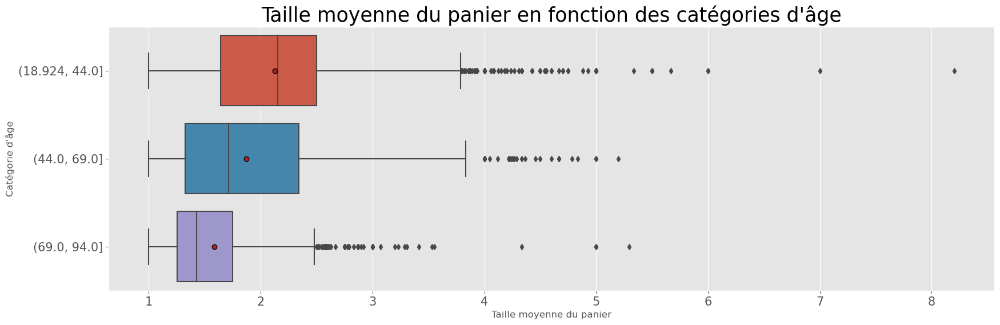

In [106]:
# Modélisation des boxplots

X = "nb_prod_par_cde" 
Y = "categ_age"

meanprops = {'marker':'o', 'markeredgecolor':'black', 'markerfacecolor':'firebrick'}

plt.figure(figsize=(20, 6))
sns.boxplot(x=df_panier_moyen[X], y=df_panier_moyen[Y], showmeans=True, meanprops=meanprops, orient="h")
plt.title("Taille moyenne du panier en fonction des catégories d'âge", fontsize = '25')
plt.xlabel("Taille moyenne du panier")
plt.ylabel("Catégorie d'âge")
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

### calcul ANOVA

In [107]:
# Je calcule une ANOVA multivarié

linear_model = ols('nb_prod_par_cde ~ C(categ_age)', data=df_panier_moyen).fit()
table = sm.stats.anova_lm(linear_model, typ=2)

print(table)

                   sum_sq      df           F         PR(>F)
C(categ_age)   251.475907     2.0  304.282393  2.096237e-128
Residual      3550.866763  8593.0         NaN            NaN


In [108]:
pvalue = linear_model.f_pvalue
print('Ici la p-value est égale à {}'.format(pvalue))

r_squared = linear_model.rsquared
print('Ici la r_squared est égale à {}'.format(r_squared))

Ici la p-value est égale à 2.0962370985545597e-128
Ici la r_squared est égale à 0.06613709733872075


In [109]:
seuil = 0.05

#Conclusion

if pvalue < seuil:
    if r_squared > correl_grand:
        print("On rejette HO : il y a une corrélation forte entre la taille du panier moyen et la catégorie d'âge.")
    elif r_squared > correl_moyen:
        print("On rejette HO : il y a une corrélation moyenne entre la taille du panier moyen et la catégorie d'âge.")
    elif r_squared > correl_petit:
        print("On rejette HO : il y a une petite corrélation entre la taille du panier moyen et la catégorie d'âge.")
elif pvalue > seuil : 
    print("On ne peut pas rejeter HO: il n'y a pas de corrélation entre la taille du panier moyen et la catégorie d'âge")

## le lien entre l'age et les catégories des livres achetés.


### Graphique BOX PLOT

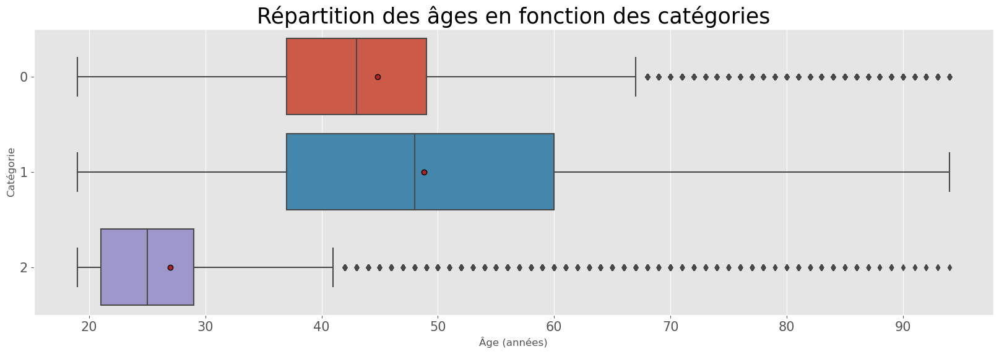

In [110]:
X = "age" # quantitative
Y = "categ" # qualitative

meanprops = {'marker':'o', 'markeredgecolor':'black', 'markerfacecolor':'firebrick'}

plt.figure(figsize=(20, 6))
plt.title("Répartition des âges en fonction des catégories", fontsize = '25')
sns.boxplot(x=df_correlation[X], y=df_correlation[Y], showmeans=True, meanprops=meanprops, orient="h")
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("Âge (années)")
plt.ylabel("Catégorie")
plt.show()

#plt.savefig("repartion_age_cat", format="jpeg")

### calcul ANOVA

In [111]:
# Calcul de l'ANOVA

linear_model = ols('age ~ C(categ)', data=df_correlation).fit()
table = sm.stats.anova_lm(linear_model, typ=2)

pvalue = linear_model.f_pvalue
print('Ici la p-value est égale à {}'.format(pvalue))

r_squared = linear_model.rsquared
print('Ici la r_squared est égale à {}'.format(r_squared))


Ici la p-value est égale à 0.0
Ici la r_squared est égale à 0.1132983619663861


In [112]:
seuil = 0.05
# se dégagent trois seuils selon l'importance de la corrélation
correl_petit = 0.1
correl_moyen = 0.3
correl_grand = 0.5
#Conclusion
if pvalue < seuil:
    if r_squared > correl_grand:
        print("On rejette HO : il y a une corrélation forte entre la catégorie de produits et l'âge.")
    elif r_squared > correl_moyen:
        print("On rejette HO : il y a une corrélation moyenne entre la catégorie de produits et l'âge.")
    elif r_squared > correl_petit:
        print("On rejette HO : il y a une petite corrélation entre la catégorie de produits et l'âge.")
elif pvalue > seuil : 
    print("On ne peut pas rejeter HO: il n'y a pas de corrélation entre la catégorie de produits et l'âge.")

On rejette HO : il y a une petite corrélation entre la catégorie de produits et l'âge.


### infos complémentaires

In [113]:
nbcommande = len(df_ca_session['session_id'])
ca_total
panier_moyen = ca_total/nbcommande
print(nbcommande,'ont été réalisées pour un CA total de',round(ca_total,1),'€ soit le prix du panier moyen est de',round(panier_moyen,2),'€')

342275 ont été réalisées pour un CA total de 11853728.7 € soit le prix du panier moyen est de 34.63 €


# probabilité

In [114]:
#On filtre sur le produit 2_159
df_2_159 = df_transa_prod_client.loc[df_transa_prod_client['id_prod'] == '2_159']

#Puis on selectionne les clients unique de la référence 2_159
df_2_159 =df_2_159['client_id'].drop_duplicates() 
df_2_159



10199     c_1609
32583     c_6714
40512      c_428
42667     c_3454
49747     c_5413
           ...  
673958    c_2105
673967     c_541
673983    c_7412
673990    c_5710
674010    c_1395
Name: client_id, Length: 530, dtype: object

In [115]:
#On filtre sur le produit 0_525
df_0_525 = df_transa_prod_client.loc[df_transa_prod_client['id_prod'] == '0_525']

#On selectionne les clients unique de la référence 0_525
df_0_525 =df_0_525['client_id'].drop_duplicates() 

df_0_525


19203     c_1609
36019     c_6714
40633      c_428
45291     c_3454
49832     c_5413
           ...  
673522    c_2528
673930     c_171
673962    c_2105
673973     c_541
673986    c_7412
Name: client_id, Length: 459, dtype: object

In [116]:
#On selectionne les clients unique qui ont commandés les deux références
nb_client_commun = len(df_0_525.isin(df_2_159)) 
nb_client_2_159 = len(df_2_159)

#On calcul la probabilité
proba=(nb_client_commun/nb_client_2_159)*100  

#On affiche la probabilité
print("La probabilité qu'un client achète la référence 0_525 sachant qu'il a déjà acheté la référence 2_159 est de:",round(proba,2),"%" )

La probabilité qu'un client achète la référence 0_525 sachant qu'il a déjà acheté la référence 2_159 est de: 86.6 %
